This is new **code**

In [ ]:
!pip install gymnasium[all] stable-baselines3==2.2.1 box2d-py mujoco

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 374.5/374.5 kB 4.5 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 44.4/44.4 kB 1.5 MB/s eta 0:00:00
INFO: pip is looking at multiple versions of gymnasium[all] to determine which version is compatible with other requirements. This could take a while.
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 374.4/374.4 kB 4.9 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 181.7/181.7 kB 7.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.9/1.9 MB 39.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 6.6/6.6 MB 63.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.9/1.9 MB 35.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 953.9/953.9 kB 34.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.3/1.3 MB 40.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.4/2.4 MB 2

In [ ]:
# Install Gymnasium and MuJoCo (DeepMind version)
!pip install gymnasium[mujoco] stable-baselines3==2.2.1

  Using cached stable_baselines3-2.2.1-py3-none-any.whl.metadata (5.0 kB)
  Using cached gymnasium-0.29.1-py3-none-any.whl.metadata (10 kB)
INFO: pip is looking at multiple versions of gymnasium[mujoco] to determine which version is compatible with other requirements. This could take a while.
  Using cached gymnasium-1.1.0-py3-none-any.whl.metadata (9.4 kB)
  Using cached gymnasium-1.0.0-py3-none-any.whl.metadata (9.5 kB)
  Using cached mujoco-3.3.2-cp311-cp311-manylinux_2_17_x86_64.manylinux2014_x86_64.whl.metadata (44 kB)
  Using cached glfw-2.9.0-py2.py27.py3.py30.py31.py32.py33.py34.py35.py36.py37.py38.p39.p310.p311.p312.p313-none-manylinux_2_28_x86_64.whl.metadata (5.4 kB)
  Using cached nvidia_cuda_nvrtc_cu12-12.4.127-py3-none-manylinux2014_x86_64.whl.metadata (1.5 kB)
  Using cached nvidia_cuda_runtime_cu12-12.4.127-py3-none-manylinux2014_x86_64.whl.metadata (1.5 kB)
  Using cached nvidia_cuda_cupti_cu12-12.4.127-py3-none-manylinux2014_x86_64.whl.metadata (1.6 kB)
  Using cached

In [ ]:
import gymnasium as gym

env = gym.make("Hopper-v4", render_mode=None)
obs, _ = env.reset()

done = False
while not done:
    action = env.action_space.sample()
    obs, reward, terminated, truncated, _ = env.step(action)
    done = terminated or truncated

env.close()


In [ ]:
import os
import gymnasium as gym
from stable_baselines3 import PPO
from stable_baselines3.common.env_util import make_vec_env

In [ ]:
import os
from stable_baselines3 import PPO
from stable_baselines3.common.env_util import make_vec_env
from stable_baselines3.common.vec_env import VecNormalize
from stable_baselines3.common.callbacks import EvalCallback, StopTrainingOnRewardThreshold

log_dir = "./logs/"
os.makedirs(log_dir, exist_ok=True)

# Create vectorized environment
env = make_vec_env("Hopper-v4", n_envs=8)  # Increase to 8 envs for faster data collection
env = VecNormalize(env, norm_obs=True, norm_reward=True, clip_obs=10.)

# Evaluation environment (for stable eval)
eval_env = make_vec_env("Hopper-v4", n_envs=1)
eval_env = VecNormalize(eval_env, norm_obs=True, norm_reward=False, clip_obs=10.)

# Callbacks for evaluation and early stopping
stop_callback = StopTrainingOnRewardThreshold(reward_threshold=3800, verbose=1)
eval_callback = EvalCallback(
    eval_env,
    callback_on_new_best=stop_callback,
    eval_freq=10_000,  # Evaluate every 10k steps
    best_model_save_path=log_dir,
    verbose=1
)

model = PPO(
    "MlpPolicy",
    env,
    learning_rate=3e-4,
    n_steps=2048,
    batch_size=64 * 8,  # batch_size should be divisible by n_envs (8 envs * 64)
    n_epochs=10,
    gamma=0.99,
    gae_lambda=0.95,
    ent_coef=0.01,
    clip_range=0.2,
    verbose=1,
    tensorboard_log="./ppo_hopper_tb/"
)

# Train for 1 million timesteps (~1 million steps usually required)
model.learn(total_timesteps=5_000_00, callback=eval_callback)

# Save final model and normalization stats
model.save(os.path.join(log_dir, "ppo_hopper_final"))
env.save(os.path.join(log_dir, "vecnormalize.pkl"))


Using cpu device
Logging to ./ppo_hopper_tb/PPO_1
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 17.6     |
|    ep_rew_mean     | 13.8     |
| time/              |          |
|    fps             | 2276     |
|    iterations      | 1        |
|    time_elapsed    | 7        |
|    total_timesteps | 16384    |
---------------------------------
----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 29.3       |
|    ep_rew_mean          | 29         |
| time/                   |            |
|    fps                  | 1861       |
|    iterations           | 2          |
|    time_elapsed         | 17         |
|    total_timesteps      | 32768      |
| train/                  |            |
|    approx_kl            | 0.01044099 |
|    clip_fraction        | 0.0986     |
|    clip_range           | 0.2        |
|    entropy_loss         | -4.23      |
|    explained_variance   | -0.55531

In [ ]:
model.save("ppo_Hopper-v4")

In [ ]:
# Ensure the models directory exists
os.makedirs("models", exist_ok=True)

# Choose environment (you can change to Humanoid-v4, Ant-v4, etc.)
env_name = "Hopper-v4"

# Create a vectorized environment
env = make_vec_env(env_name, n_envs=1)

# Initialize the PPO model

policy_kwargs = dict(net_arch=[dict(pi=[256, 256], vf=[256, 256])])
model = PPO("MlpPolicy", env, policy_kwargs=policy_kwargs, verbose=1)
# Train the agent
model.learn(total_timesteps=5_000_00)

# Save the trained model
model.save(f"models/ppo_{env_name.lower()}")
print(f"Model saved as models/ppo_{env_name.lower()}.zip")


Using cpu device


/usr/local/lib/python3.11/dist-packages/stable_baselines3/common/policies.py:484: UserWarning: As shared layers in the mlp_extractor are removed since SB3 v1.8.0, you should now pass directly a dictionary and not a list (net_arch=dict(pi=..., vf=...) instead of net_arch=[dict(pi=..., vf=...)])
  warnings.warn(


Streaming output truncated to the last 5000 lines.
|    n_updates            | 170         |
|    policy_gradient_loss | -0.00671    |
|    std                  | 0.913       |
|    value_loss           | 78.2        |
-----------------------------------------
------------------------------------------
| rollout/                |              |
|    ep_len_mean          | 113          |
|    ep_rew_mean          | 267          |
| time/                   |              |
|    fps                  | 423          |
|    iterations           | 19           |
|    time_elapsed         | 91           |
|    total_timesteps      | 38912        |
| train/                  |              |
|    approx_kl            | 0.0126158595 |
|    clip_fraction        | 0.189        |
|    clip_range           | 0.2          |
|    entropy_loss         | -3.97        |
|    explained_variance   | 0.93448496   |
|    learning_rate        | 0.0003       |
|    loss                 | 13.4         |
|    n_u

In [ ]:

# Load environment
eval_env = gym.make(env_name)

# Load the saved PPO model
model = PPO.load(f"models/ppo_{env_name.lower()}")

# Evaluate the trained agent
episodes = 50
for ep in range(episodes):
    obs, _ = eval_env.reset()
    done = False
    total_reward = 0
    while not done:
        action, _states = model.predict(obs)
        obs, reward, terminated, truncated, _ = eval_env.step(action)
        total_reward += reward
        done = terminated or truncated
    print(f"Episode {ep + 1}: Reward = {total_reward}")


Episode 1: Reward = 3132.7061787841576
Episode 2: Reward = 858.8347677538509
Episode 3: Reward = 3093.515027080912
Episode 4: Reward = 931.3446404515641
Episode 5: Reward = 3037.4808549256622
Episode 6: Reward = 3005.4923989861745
Episode 7: Reward = 950.2552262261391
Episode 8: Reward = 3092.4564147529454
Episode 9: Reward = 1484.4027665426815
Episode 10: Reward = 2268.7057739146776
Episode 11: Reward = 2899.5351191364557
Episode 12: Reward = 926.3114491127254
Episode 13: Reward = 1844.7458955998259
Episode 14: Reward = 929.1092528995497
Episode 15: Reward = 3115.2935333911814
Episode 16: Reward = 939.3359774713427
Episode 17: Reward = 984.008892269376
Episode 18: Reward = 3131.0837353940083
Episode 19: Reward = 1899.0601787051926
Episode 20: Reward = 1059.1302986591154
Episode 21: Reward = 3068.482164519268
Episode 22: Reward = 967.2241554606612
Episode 23: Reward = 833.1958458032676
Episode 24: Reward = 3089.1770900213282
Episode 25: Reward = 835.149843544788
Episode 26: Reward = 31

In [ ]:
# Install xvfb and dependencies
!apt-get install -y xvfb libgl1-mesa-glx
!pip install pyvirtualdisplay

# Start virtual display
from pyvirtualdisplay import Display
display = Display(visible=0, size=(1400, 900))
display.start()


Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
libgl1-mesa-glx is already the newest version (23.0.4-0ubuntu1~22.04.1).
xvfb is already the newest version (2:21.1.4-2ubuntu1.7~22.04.14).
0 upgraded, 0 newly installed, 0 to remove and 34 not upgraded.


In [ ]:
import gymnasium as gym
from PIL import Image
import numpy as np

# Make the environment with render_mode
eval_env = gym.make("Hopper-v4", render_mode="rgb_array")
obs, _ = eval_env.reset()
done = False
frames = []

while not done:
    frame = eval_env.render()  # No mode argument needed
    frames.append(Image.fromarray(frame))  # Collect frame
    action = eval_env.action_space.sample()
    obs, reward, terminated, truncated, _ = eval_env.step(action)
    done = terminated or truncated

eval_env.close()

# Save as GIF
frames[0].save("hopper_run.gif", save_all=True, append_images=frames[1:], duration=100, loop=0)


In [ ]:
import matplotlib.pyplot as plt
from IPython import display
from PIL import Image
import numpy as np
import gymnasium as gym

# Set render_mode during environment creation
eval_env = gym.make("Hopper-v4", render_mode="rgb_array")

frames = []
obs, _ = eval_env.reset()
done = False

while not done:
    frame = eval_env.render()  # No mode='rgb_array' here
    frames.append(Image.fromarray(frame))
    action, _ = model.predict(obs)
    obs, reward, terminated, truncated, _ = eval_env.step(action)
    done = terminated or truncated

eval_env.close()

# Display one of the frames
frames[0].show()


In [ ]:
from stable_baselines3.common.monitor import Monitor
env = Monitor(env)


In [ ]:
from stable_baselines3.common.evaluation import evaluate_policy

# Evaluate the PPO model on 10 episodes
mean_reward, std_reward = evaluate_policy(model, eval_env, n_eval_episodes=10, render=False)
print(f"PPO Agent - Mean Reward: {mean_reward}, Std Dev: {std_reward}")


/usr/local/lib/python3.11/dist-packages/stable_baselines3/common/evaluation.py:67: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


PPO Agent - Mean Reward: 904.683865249157, Std Dev: 16.289396238035426


In [ ]:
random_rewards = []
for _ in range(10):
    obs, _ = eval_env.reset()
    done = False
    total_reward = 0
    while not done:
        action = eval_env.action_space.sample()
        obs, reward, terminated, truncated, _ = eval_env.step(action)
        total_reward += reward
        done = terminated or truncated
    random_rewards.append(total_reward)

print(f"Random Agent - Mean Reward: {np.mean(random_rewards)}, Std Dev: {np.std(random_rewards)}")


Random Agent - Mean Reward: 10.69231086118705, Std Dev: 2.427912605489875


In [ ]:
from stable_baselines3.common.results_plotter import load_results
import matplotlib.pyplot as plt

results = load_results(log_dir)

# Plot reward vs. episode number
plt.plot(results['r'])
plt.xlabel("Episode")
plt.ylabel("Episodic Reward")
plt.title("Learning Curve of PPO on Hopper-v4")
plt.grid(True)
plt.show()



LoadMonitorResultsError: No monitor files of the form *monitor.csv found in ./logs/

In [ ]:
import os
os.listdir("models")

['ppo_hopper-v4.zip']

In [ ]:
print(env_name)  # should be 'Hopper-v4'
print(f"models/ppo_{env_name.lower()}.zip")  # This should match the path you load from


Hopper-v4
models/ppo_hopper-v4.zip


Save video as GIF

In [ ]:
gif_path = "ppo_hopper.gif"
frames[0].save(
    gif_path,
    save_all=True,
    append_images=frames[1:],
    duration=30,
    loop=0,
)
print(f"Saved agent movement as {gif_path}")

Saved agent movement as ppo_hopper.gif


Display video in Colab

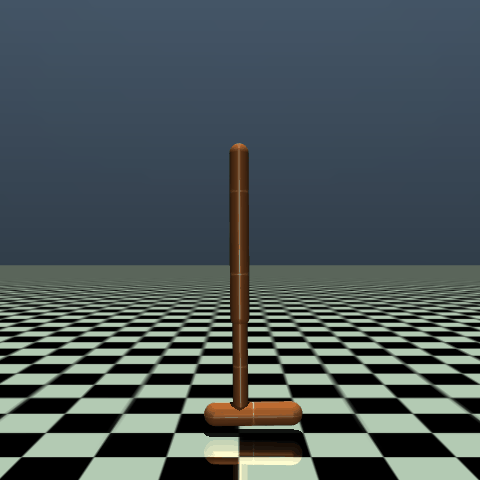

In [ ]:
from IPython.display import Image as IPyImage, display as ipydisplay
ipydisplay(IPyImage(filename=gif_path))